In [1]:
import json
from datetime import datetime
from pathlib import Path

import h5py
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy.ndimage as ndimage
import scipy.signal as signal
import seaborn as sns
import trackpy
import yaml
from IPython.display import display, HTML
from matplotlib import cm
from sklearn.kernel_ridge import KernelRidge
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from tqdm import tqdm, trange

from confocal_microscopy.files import ims
from confocal_microscopy.roi_tools import centerline as centerline_tools
from confocal_microscopy.tracking.utils import load_background
from confocal_microscopy.plotting.dynamic_plots import implay

Invalid MIT-MAGIC-COOKIE-1 key

In [2]:
image_path = Path(
    "/media/yngve/TOSHIBA EXT (YNGVE)/fish_data/organised/"
    "7 DAY OLD Fish without tumors/Fish 4/"
    "artery/1000"
)
image_path = sorted(image_path.glob("*.ims"))[0]

roi_id = 0
min_auto_track_len = 5

# Load image and imaging parameters

In [3]:
## Load data
# Load image stack
image_path = Path(image_path)
metadata = ims.load_ims_metadata(image_path)

# Load image background
bg_path = next(image_path.parent.parent.glob("*Snap*.ims"))
background = load_background(bg_path)

In [4]:
## Get the image metadata
image_size = ims.find_physical_image_size(metadata)[1:]
pixel_size = np.round(np.array(image_size) / background.shape, 3)

timestamps = [datetime.fromisoformat(metadata['TimeInfo'][f'TimePoint{i+1}']) for i in range(7000)]
timestamps = [t - timestamps[0] for t in timestamps]
timestamps = [(t.seconds + t.microseconds*1e-6) for t in timestamps]
timestamps = np.linspace(0, timestamps[-1], len(timestamps))

timestep = timestamps[-1]/len(timestamps)

# Load manual ROI and compute centerline

In [5]:
# Load the ROI and centerline
with open(bg_path.parent/f"{bg_path.stem}_vertices.json") as f:
    annotated_info = json.load(f)
    
roi = annotated_info['vertices'][roi_id]
centerline = np.stack([annotated_info['centerlines'][roi_id]['x'], annotated_info['centerlines'][roi_id]['y']], axis=1)

In [6]:
## Find nearest centerline direction for each pixel
nearest_centerline_indices = centerline_tools.find_all_nearest_centerline_indices_from_roi(
    roi,
    background.shape,
    centerline
)
nearest_centerline_direction = centerline_tools.find_nearest_centerline_direction(nearest_centerline_indices, centerline)

distance_to_centerline__µm = centerline_tools.find_distance_to_centerline_from_roi(roi, background.shape, centerline) * pixel_size[0]

# Load small snippet of particle tracks and create animation

In [7]:
image_stack = ims.load_video_stack(image_path, num_timesteps=500).squeeze().astype(float)
fig, ax = plt.subplots(figsize=(background.shape[1]/100, background.shape[0]/100), dpi=75, facecolor="#00000000")
ax.axis('off')
anim = implay(image_stack, cmap='gray', fig=fig, ax=ax)
plt.close(fig)

display(HTML(anim.to_html5_video()))

# Remove background signal (median) from animation

In [8]:
image_stack -= np.median(image_stack, axis=0, keepdims=True)
fig, ax = plt.subplots(figsize=(background.shape[1]/100, background.shape[0]/100), dpi=75, facecolor="#00000000")
ax.axis('off')
anim = implay(image_stack, vmin=0, cmap='gray', fig=fig, ax=ax)
plt.close(fig)

display(HTML(anim.to_html5_video()))

# Load particle tracks

In [9]:
# Load velocity profiles
auto_track_data = pd.read_csv(image_path.parent / f"{image_path.stem}.csv").drop("frame.1", axis=1)
auto_track_data = trackpy.filter_stubs(auto_track_data, min_auto_track_len)
auto_track_data = auto_track_data.drop("frame", axis=1).reset_index()

Parametrising plot


  0%|                                                                                      | 0/2726 [00:00<?, ?it/s]/usr/lib/python3/dist-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/usr/lib/python3/dist-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/usr/lib/python3/dist-packages/matplotlib/axes/_base.py:278: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  y = y[:, np.newaxis]
100%|██████████████████████████████████████████████████████████████████████████

Drawing plot, this may take some time...


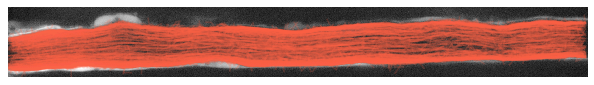

In [10]:
plt.figure(figsize=(background.shape[1]/100, background.shape[0]/100), dpi=75, facecolor="#00000000")
plt.imshow(np.log(background), "gray")

print("Parametrising plot")
for group, grouped_df in tqdm(auto_track_data.groupby("particle")):
    plt.plot(grouped_df["x"], grouped_df["y"], "-", alpha=0.2, color='tomato')

print("Drawing plot, this may take some time...")
plt.axis('off')
plt.savefig("auto_tracks.png")
plt.show()

# Load manually labelled particle tracks

In [11]:
with open(image_path.parent / f"{image_path.stem}-manualTrack.yml", "r") as f:
    manual_tracks = yaml.unsafe_load(f)[0]

df_data = []
for manual_track_id, manual_track_data in manual_tracks.items():
    for frame, (x,y) in manual_track_data.items():
        df_data.append({'particle': manual_track_id, 'frame': frame, 'x': x, 'y': y})

manual_track_data = pd.DataFrame(df_data)
del df_data

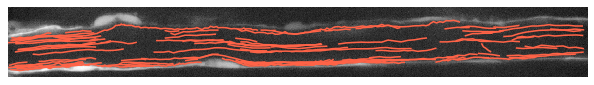

In [12]:
plt.figure(figsize=(background.shape[1]/100, background.shape[0]/100), dpi=75, facecolor="#00000000")
plt.imshow(np.log(background), "gray")
for group, grouped_df in manual_track_data.groupby("particle"):
    plt.plot(grouped_df["x"], grouped_df["y"], "-", color='tomato')
    
plt.axis('off')
plt.savefig("manual_tracks.png")
plt.show()

## Compute velocities

In [13]:
def compute_velocities(track_data):
    velocity_data = []
    for particle, single_particle_track in track_data.groupby("particle"):
        single_particle_track['vx'] = pixel_size[0] * single_particle_track['x'].diff() / (single_particle_track['frame'].diff() * timestep)
        single_particle_track['vy'] = pixel_size[1] * single_particle_track['y'].diff() / (single_particle_track['frame'].diff() * timestep)
        velocity_data.append(single_particle_track)

    particle_track = pd.concat(velocity_data)
    particle_track['v'] = np.sqrt(particle_track['vx']**2 + particle_track['vy']**2)
    return particle_track

In [14]:
manual_particle_track = compute_velocities(manual_track_data)
auto_particle_track = compute_velocities(auto_track_data)

In [15]:
auto_velocity_data = []
for particle, single_particle_track in tqdm(auto_track_data.groupby("particle")):
    single_particle_track['vx'] = pixel_size[0] * single_particle_track['x'].diff() / (single_particle_track['frame'].diff() * timestep)
    single_particle_track['vy'] = pixel_size[1] * single_particle_track['y'].diff() / (single_particle_track['frame'].diff() * timestep)
    auto_velocity_data.append(single_particle_track)
auto_particle_track = pd.concat(auto_velocity_data)
auto_particle_track['v'] = np.sqrt(auto_particle_track['vx']**2 + auto_particle_track['vy']**2)

100%|███████████████████████████████████████████████████████████████████████████| 2726/2726 [00:29<00:00, 91.58it/s]


## Estimate distance to centerline

In [16]:
for idx, row in tqdm(manual_particle_track.iterrows(), total=manual_particle_track.shape[0]):
    x = np.floor(row['x']).astype(int)
    y = np.floor(row['y']).astype(int)
    manual_particle_track.loc[idx, 'Distance to centerline'] = distance_to_centerline__µm[y, x]
    
for idx, row in tqdm(auto_particle_track.iterrows(), total=auto_particle_track.shape[0]):
    x = np.floor(row['x']).astype(int)
    y = np.floor(row['y']).astype(int)
    auto_particle_track.loc[idx, 'Distance to centerline'] = distance_to_centerline__µm[y, x]


x = np.arange(background.shape[1])
y = np.arange(background.shape[0])

100%|████████████████████████████████████████████████████████████████████████| 36032/36032 [01:40<00:00, 359.34it/s]


## Naive radius and pressure estimation

In [17]:
radius = 1.1*(
    auto_particle_track.groupby(pd.cut(auto_particle_track["x"], 500)).max()["y"]
    - auto_particle_track.groupby(pd.cut(auto_particle_track["x"], 500)).min()["y"]
)*pixel_size[1]/2  # Multiply by 1.1 to prevent division by zero

manual_particle_track["r"] = manual_particle_track["x"].map(lambda x: radius[np.floor(x)])
auto_particle_track["r"] = auto_particle_track["x"].map(lambda x: radius[np.floor(x)])

mu = 4.2
auto_particle_track["p"] = (4 * mu * auto_particle_track["v"]) / (auto_particle_track["r"]**2 - auto_particle_track["Distance to centerline"]**2)

## Compute mean velocities per pixel

In [18]:
#velocities__µm_per_s = np.zeros((7000, *background.shape, 2), dtype=np.float32)*np.nan
def estimate_mean_velocity__µm_per_s(track):
    mean_velocity__µm_per_s = np.zeros((*background.shape, 2))
    mean_speed__µm_per_s = np.zeros(background.shape)
    num_measurements = np.zeros(background.shape)

    for idx, row in tqdm(track.iterrows(), total=track.shape[0]):
        frame = row['frame'].astype(int)
        x = np.floor(row['x']).astype(int)
        y = np.floor(row['y']).astype(int)

        mean_velocity__µm_per_s[y, x, 0] += row['vx']
        mean_velocity__µm_per_s[y, x, 1] += row['vy']
        mean_speed__µm_per_s[y, x] += row['v']
        num_measurements[y, x] += 1


    mean_velocity__µm_per_s /= num_measurements[..., np.newaxis]
    mean_speed__µm_per_s /= num_measurements
    
    return mean_velocity__µm_per_s, mean_speed__µm_per_s, num_measurements


(
    manual_mean_velocity__µm_per_s,
    manual_mean_speed__µm_per_s,
    manual_num_measurements
) = estimate_mean_velocity__µm_per_s(manual_particle_track)

(
    auto_mean_velocity__µm_per_s,
    auto_mean_speed__µm_per_s,
    auto_num_measurements
) = estimate_mean_velocity__µm_per_s(auto_particle_track)



100%|█████████████████████████████████████████████████████████████████████████| 1346/1346 [00:00<00:00, 1820.17it/s]
/tmp/ipykernel_51213/2346913678.py:18: RuntimeWarning: invalid value encountered in true_divide
  mean_velocity__µm_per_s /= num_measurements[..., np.newaxis]
/tmp/ipykernel_51213/2346913678.py:19: RuntimeWarning: invalid value encountered in true_divide
  mean_speed__µm_per_s /= num_measurements
100%|███████████████████████████████████████████████████████████████████████| 36032/36032 [00:13<00:00, 2633.51it/s]


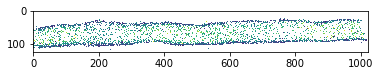

In [19]:
plt.imshow(auto_mean_speed__μm_per_s)

## Compare automatic and manual data

In [20]:
num_common_auto = 0
num_missed_auto = 0
num_common_manual = 0
num_missed_manual = 0

match_parrticles_closer_than__pixels = 5

v_manual, v_auto = [], []
particles_manual, particles_auto = [], []
frames = []
manual_missed_x, manual_missed_y, manual_common_x, manual_common_y = [], [], [], []
manual_missed_v, manual_common_v = [], []
auto_missed_x, auto_missed_y, auto_common_x, auto_common_y = [], [], [], []
auto_missed_v, auto_common_v = [], []

for frame in trange(manual_particle_track["frame"].max() - 20):
    auto_track_frame = auto_particle_track[auto_particle_track["frame"] == frame]
    track_frame = manual_particle_track[manual_particle_track["frame"] == frame]
    
    for particle, x, y, v in zip(track_frame['particle'], track_frame['x'], track_frame['y'], track_frame['v']):
        dist_x = auto_track_frame['x'] - x
        dist_y = auto_track_frame['y'] - y
        dist = np.sqrt(dist_x **2 + dist_y**2)

        if (dist < match_parrticles_closer_than__pixels).sum() > 1:
            print("Ambiguous for frame", frame)
        if any(dist.values < match_parrticles_closer_than__pixels):
            num_common_manual += 1
            v_manual.append(v)
            v_auto.append(auto_track_frame.loc[dist.idxmin(), 'v'])
            particles_manual.append(particle)
            particles_auto.append(auto_track_frame.loc[dist.idxmin(), 'particle'])
            frames.append(frame)
            manual_common_x.append(x)
            manual_common_y.append(y)
            manual_common_v.append(v)
        else:
            num_missed_manual += 1
            manual_missed_x.append(x)
            manual_missed_y.append(y)
            manual_missed_v.append(v)
    
    for x, y, v in zip(auto_track_frame['x'], auto_track_frame['y'], auto_track_frame['v']):
        dist_x = track_frame['x'] - x
        dist_y = track_frame['y'] - y
        dist = np.sqrt(dist_x **2 + dist_y**2).values
        
        if (dist < match_parrticles_closer_than__pixels).sum() > 1:
            print("Ambiguous for frame", frame)
        if any(dist < match_parrticles_closer_than__pixels):
            num_common_auto += 1
            auto_common_x.append(x)
            auto_common_y.append(y)
            auto_common_v.append(v)
        else:
            num_missed_auto += 1
            auto_missed_x.append(x)
            auto_missed_y.append(y)
            auto_missed_v.append(v)


100%|█████████████████████████████████████████████████████████████████████████████| 480/480 [00:11<00:00, 41.97it/s]


In [21]:
print("Sensitivity: ", num_common_manual / (num_common_manual + num_missed_manual))
print("PPV: ", num_common_manual / (num_common_auto + num_missed_auto))

Sensitivity:  0.8075471698113208
PPV:  0.6257309941520468


Text(0.5, 1.0, 'Histogram of velocities')

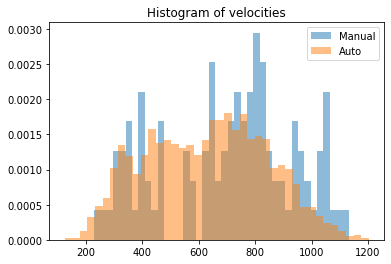

In [22]:
manual_particle_track.groupby("particle").mean()["v"].hist(density=True, bins=40, label="Manual", alpha=0.5)
auto_particle_track.groupby("particle").mean()["v"].hist(density=True, bins=40, label="Auto", alpha=0.5)
plt.grid()
plt.legend()
plt.title("Histogram of velocities")

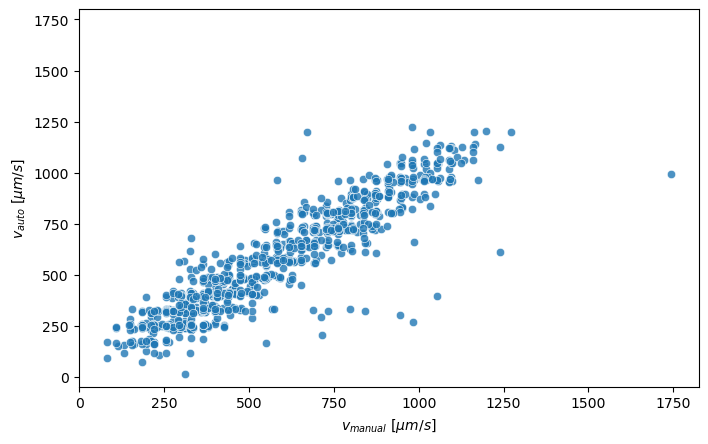

In [23]:
df = pd.DataFrame({
    'particle_manual': particles_manual,
    'particles_auto': particles_auto,
    'v_manual': v_manual,
    'v_auto': v_auto,
    'frames': frames
})
fig, ax = plt.subplots(figsize=(8, 5), dpi=100)
sns.scatterplot(
    x='$v_{manual}~[\mu m/s]$', y='$v_{auto}~[\mu m/s]$',
    data=df.rename({'v_auto': '$v_{auto}~[\mu m/s]$', 'v_manual': '$v_{manual}~[\mu m/s]$'}, axis=1),
    ax=ax,
    alpha=0.8
)
ax.set_ylim(top=1800)
plt.savefig("auto_vs_manual.png")

In [24]:
from ipywidgets import interact
frame = 398

@interact(frame=(0, manual_particle_track["frame"].max()))
def replot(frame):
    with h5py.File(image_path, "r") as h5:
        data = h5[f'DataSet/ResolutionLevel 0/TimePoint {frame}/Channel 0/Data'][:].astype(float)


    data -= data.min()
    data /= data.max()
    plt.figure(dpi=200)
    plt.imshow(data.squeeze(), vmin=0.4, vmax=0.8, cmap='gray')


    auto_track_frame = auto_particle_track[auto_particle_track["frame"] == frame]
    manual_track_frame = manual_particle_track[manual_particle_track["frame"] == frame]

    for particle, x, y in auto_track_frame[['particle', 'x', 'y']].values:
        plt.annotate(f'{particle:.0f}', (x, y), color='red')
        plt.scatter(x, y, color='red', s=1, alpha=0.5)

    for particle, x, y in manual_track_frame[['particle', 'x', 'y']].values:
        plt.annotate(f'{particle:.0f}', (x, y), color='blue', verticalalignment='top')
        plt.scatter(x, y, color='blue', s=1, alpha=0.5)

interactive(children=(IntSlider(value=250, description='frame', max=500), Output()), _dom_classes=('widget-int…

## Look at mean velocity for each pixel

/tmp/ipykernel_51213/2538689192.py:7: RuntimeWarning: invalid value encountered in greater
  clipped_speeds = np.where((repeated_speeds > max_val), 0, auto_mean_velocity__µm_per_s)


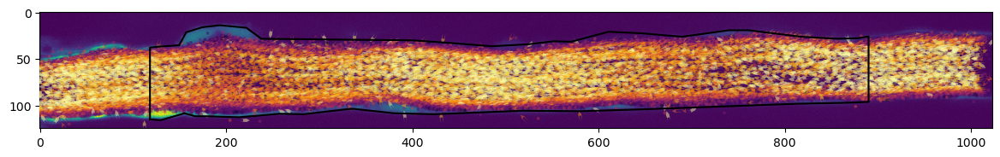

In [25]:
x = np.arange(background.shape[1])
y = np.arange(background.shape[0])
xx, yy = np.meshgrid(x, y)

max_val = np.nanpercentile(auto_mean_speed__μm_per_s, 90)
repeated_speeds = np.stack([auto_mean_speed__μm_per_s]*2, axis=-1)
clipped_speeds = np.where((repeated_speeds > max_val), 0, auto_mean_velocity__µm_per_s)
mask = ~np.isnan(clipped_speeds[..., 0])

plt.figure(figsize=(15, 1.8), dpi=100)
plt.imshow(background)
plt.quiver(
    xx[mask],
    yy[mask],
    auto_mean_velocity__µm_per_s[..., 0][mask],
    auto_mean_velocity__µm_per_s[..., 1][mask],
    color=cm.inferno((np.minimum(auto_mean_speed__μm_per_s, max_val) / max_val)[mask].ravel()),
    alpha=0.5,
    zorder=5,
    headwidth=1.5,
    headlength=1.5,
    minlength=1.5
)
plt.plot(roi['x'], roi['y'], color='black', zorder=10)
plt.show()

## Look at downscaled ROI measurements

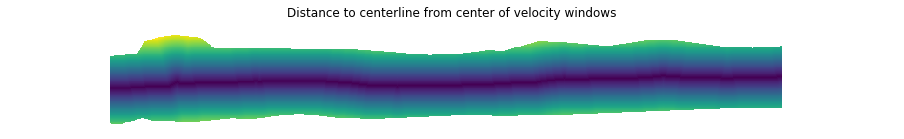

In [26]:
x_idx = x.astype(int)
y_idx = y.astype(int)


fig = plt.figure(figsize=(18, 2))
plt.title("Distance to centerline from center of velocity windows")
plt.imshow(distance_to_centerline__µm)
plt.axis('off')

plt.show()

## Look at the estimated velocities with nearest neighbour interpolation

In [27]:
xx, yy = np.meshgrid(x, y)
relevant = ~np.isnan(auto_mean_speed__µm_per_s)
xy = np.stack([xx[relevant], yy[relevant]], axis=-1)
nbrs = KNeighborsRegressor(n_neighbors=1).fit(xy, auto_mean_speed__µm_per_s[relevant])

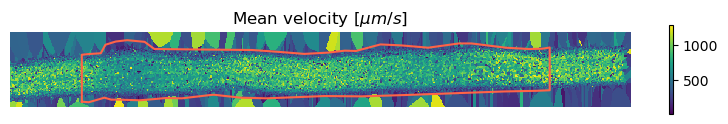

In [28]:
fig = plt.figure(figsize=(10, 4), dpi=100)

plt.subplot(311)
plt.axis('off')
plt.title("Mean velocity [$µm/s$]")


zz = nbrs.predict(np.stack([xx.ravel(), yy.ravel()], axis=-1)).reshape(xx.shape)
plt.imshow(zz)
plt.plot(roi['x'], roi['y'], color='tomato')
plt.colorbar()
plt.show()

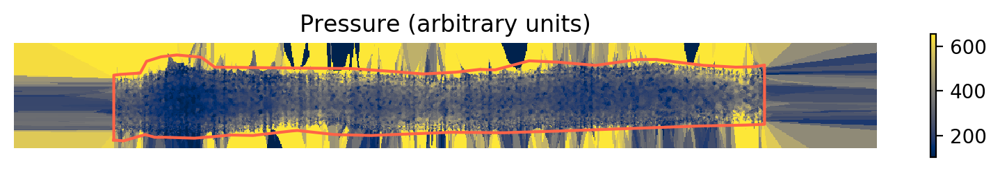

In [29]:
xx, yy = np.meshgrid(x, y)
relevant = ~np.isnan(auto_particle_track["v"])
nbrs = KNeighborsRegressor(n_neighbors=3).fit(
    auto_particle_track.dropna()[["x", "y"]].values,
    auto_particle_track.dropna()["p"].values
)


fig = plt.figure(figsize=(10, 4), dpi=200)

plt.subplot(311)
plt.axis('off')
plt.title("Pressure (arbitrary units)")


zz = nbrs.predict(np.stack([xx.ravel(), yy.ravel()], axis=-1)).reshape(xx.shape)
plt.imshow(zz,
           vmin=auto_particle_track.dropna()["p"].quantile(0.05),
           vmax=auto_particle_track.dropna()["p"].quantile(0.95),
           cmap='cividis')
plt.plot(roi['x'], roi['y'], color='tomato')
plt.colorbar()
plt.show()

## Look at the number of measurements for each pixel

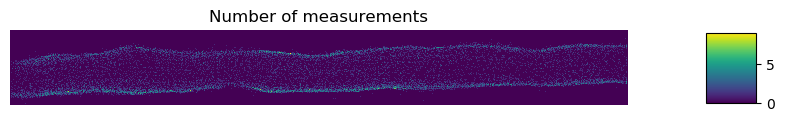

In [30]:
fig = plt.figure(figsize=(10, 1), dpi=100)
plt.subplot(111)

plt.title("Number of measurements")

plt.axis('off')
im = plt.imshow(auto_num_measurements)
fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
fig.colorbar(im, cax=cbar_ax)

plt.savefig("num_measurements.png")

plt.show()

## Statistical analysis of velocities
### Velocity as a function of distance to centerline (all frames combined)

/home/yngve/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:985: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/yngve/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:985: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/yngve/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:985: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/yngve/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:985: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to

/home/yngve/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:985: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/yngve/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:985: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/yngve/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:985: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/yngve/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:985: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to

/home/yngve/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:985: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/yngve/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:985: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/yngve/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:985: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/yngve/.local/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:372: FitFailedWarning: 
20 fits failed out of a total of 80.
The score on these train-test partitions for t

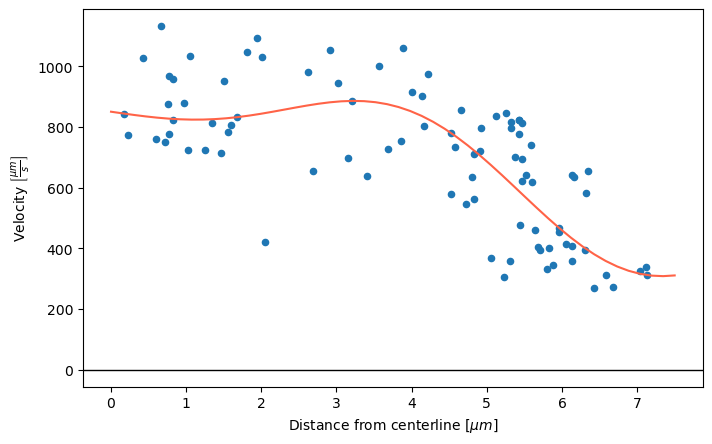

In [31]:
fig, ax = plt.subplots(figsize=(8, 5), dpi=100, facecolor="#00000000")
single_particle_averages = manual_particle_track.groupby("particle").mean()
single_particle_averages.plot.scatter(x='Distance to centerline', y="v", ax=ax)

param_grid = {"C": [1e0, 1e1, 1e2, 1e3],
              "gamma": [None, 0.1, 1, 10],
              "kernel": ["rbf"]}
kr = GridSearchCV(SVR(), param_grid=param_grid)
kr.fit(
    single_particle_averages.dropna()[['Distance to centerline']].values,
    single_particle_averages.dropna()[['v']].values
)

dist_ = np.linspace(0, 7.5)
plt.plot(
    dist_,
    kr.predict(dist_[:, np.newaxis]),
    color="tomato"
)
plt.xlabel(r"Distance from centerline $ \left[ \mu m \right] $")
plt.ylabel(r"Velocity $ \left[ \frac{\mu m}{s} \right] $")
plt.axhline(0, color='black', linewidth=1)
plt.savefig("manual_velocities.png")
plt.show()

/home/yngve/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:985: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/yngve/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:985: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/yngve/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:985: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/yngve/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:985: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to

/home/yngve/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:985: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/yngve/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:985: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/yngve/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:985: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/yngve/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:985: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to

/home/yngve/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:985: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/yngve/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:985: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/yngve/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:985: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/yngve/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:985: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to

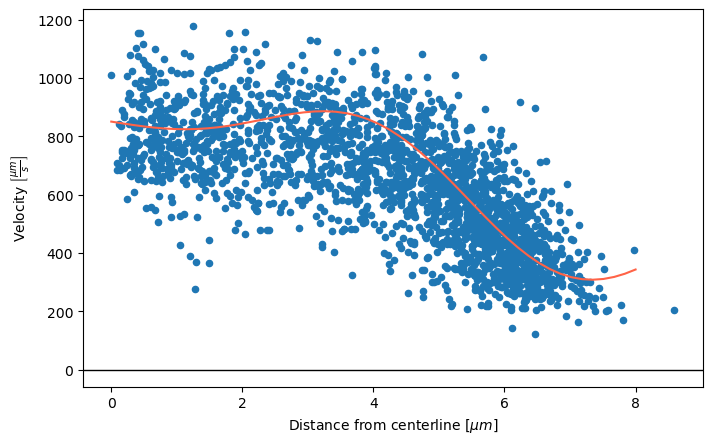

In [32]:
param_grid = {"C": [1e0, 1e1, 1e2, 1e3],
              "gamma": [None, 0.1, 1, 10],
              "kernel": ["rbf"]}
kr = GridSearchCV(SVR(), param_grid=param_grid)
kr.fit(
    single_particle_averages.dropna()[['Distance to centerline']].values,
    single_particle_averages.dropna()[['v']].values
)


fig, ax = plt.subplots(figsize=(8, 5), dpi=100, facecolor="#00000000")
single_particle_averages = auto_particle_track.groupby("particle").mean()
single_particle_averages.plot.scatter(x='Distance to centerline', y="v", ax=ax)
dist_ = np.linspace(0, 8)
plt.plot(
    dist_,
    kr.predict(dist_[:, np.newaxis]), color="tomato"
)
plt.xlabel(r"Distance from centerline $ \left[ \mu m \right] $")
plt.ylabel(r"Velocity $ \left[ \frac{\mu m}{s} \right] $")
plt.axhline(0, color='black', linewidth=1)
plt.savefig("auto_velocities.png")
plt.show()

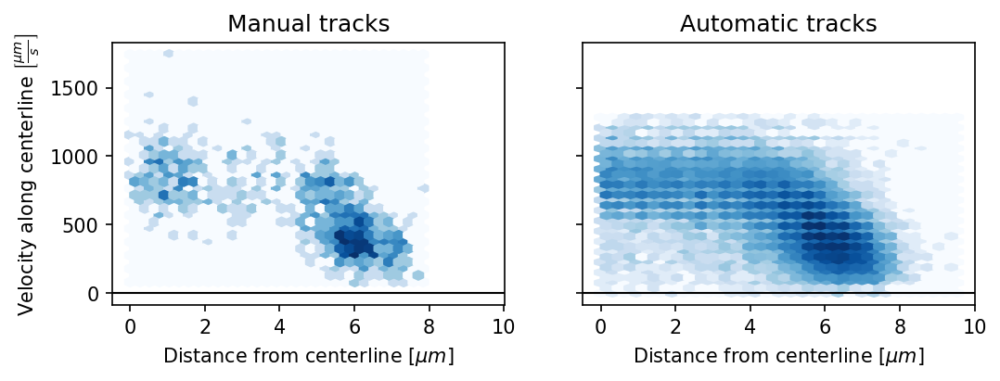

In [33]:
fig, axes = plt.subplots(1, 2, figsize=(8, 2.5), dpi=150, sharex=True, sharey=True)

axes[0].hexbin(
    x='Distance to centerline',
    y='v',
    data=manual_particle_track,
    gridsize=30,
    bins='log',
    cmap="Blues",
)
axes[1].hexbin(
    x='Distance to centerline',
    y='v',
    data=auto_particle_track,
    gridsize=30,
    bins='log',
    cmap="Blues",
)
axes[0].set_title("Manual tracks")
axes[1].set_title("Automatic tracks")

for ax in axes:
    ax.set_xlabel(r"Distance from centerline $ \left[ \mu m \right] $")
    ax.axhline(0, color='black', linewidth=1)
    
axes[0].set_ylabel(r"Velocity along centerline $ \left[ \frac{\mu m}{s} \right] $")
plt.show()

## Estimate prominent frequencies in the signal

### Estimating the velocities
Since there are few velocities measured per frame, we cannot estimate the velocity in the center of the vessels. Instead, we base the periodogram estimation on the median velocity for each frame.

For frames with no particles, we use linear interpolation between the two nearest frames without missing data.

The missing-data rate is 2%


/usr/lib/python3/dist-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/usr/lib/python3/dist-packages/matplotlib/axes/_base.py:278: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  y = y[:, np.newaxis]


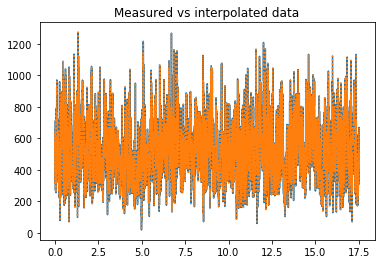

In [34]:
selected_particle_track = auto_particle_track

# Compute median across all pixels
median_track_data = pd.DataFrame(
    {'frame': np.arange(1, selected_particle_track['frame'].max())}
).set_index('frame')
median_track_data = median_track_data.join(selected_particle_track.dropna().groupby("frame").median())
imputed_median_track_data = median_track_data.interpolate(method='linear')

t = timestep * np.arange(imputed_median_track_data.index.max())

print(f"The missing-data rate is {np.isnan(median_track_data['v']).mean():.0%}")
plt.plot(t, median_track_data['v'])
plt.plot(t, imputed_median_track_data['v'], ':')
plt.title("Measured vs interpolated data")
plt.show()

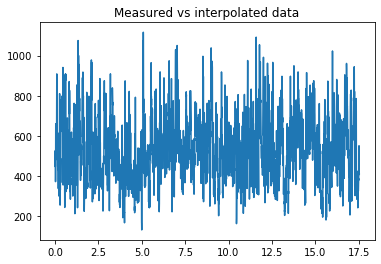

In [35]:
from scipy.ndimage import gaussian_filter1d
filter_size = 1

plt.plot(t, gaussian_filter1d(imputed_median_track_data['v'], filter_size),)
plt.title("Measured vs interpolated data")
plt.show()

### The Welch Periodogram
Estimating the periodicity of a signal can be done with the Fourier transform. However, the Fourier transform is prone to noise, and has artifacts for discrete signals.

To combat this, we use the Welch periodogram. To compute the Welch periodogram we do not use full signal. Instead, we separate a length-$N$ signal into $\lfloor 2\frac{N-1}{n} \rfloor$ segments each of length $n$. Each segment (except the two border segments) overlap $50\%$ with two other segments and $0\%$ with the rest. Then, we use the Fourier transform of each of these segments to estimate their periodogra, and take the average periodogram to obtain the Welch periodogram.

To account for discrete sampling of the signal, we use a *window* function. These functions reduce the influence of the beginning and end of the signal to reduce the spectral leakage. For these periodograms, I used the *Hann* window function.

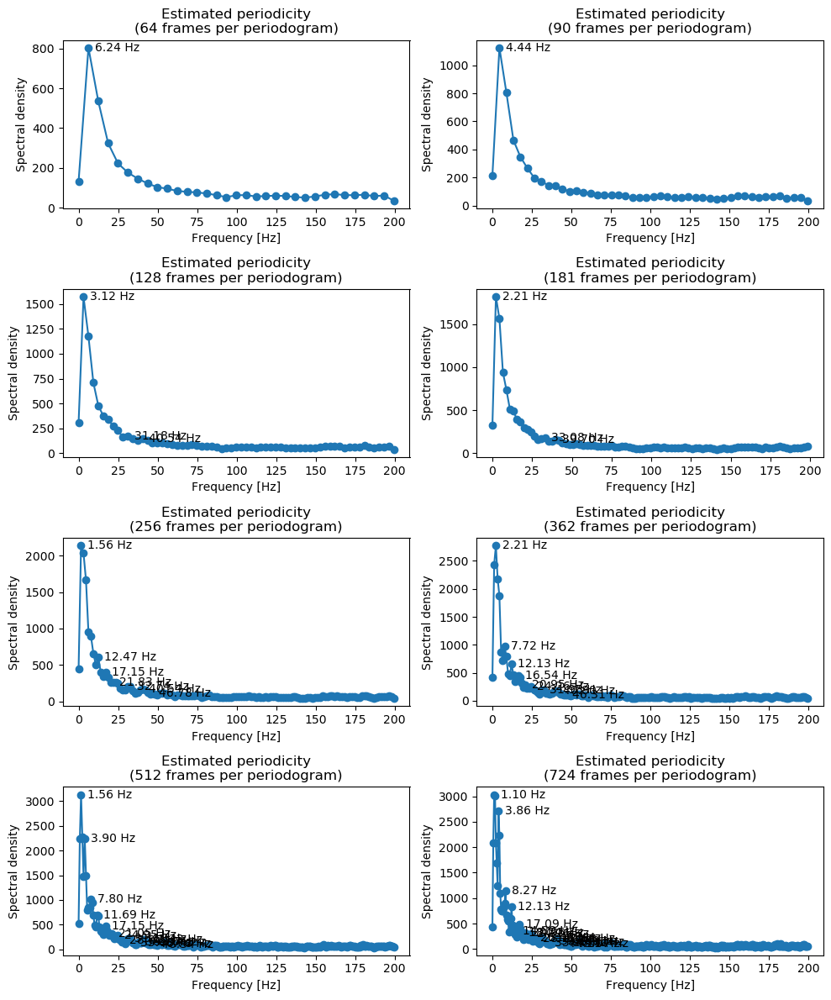

In [36]:
fig, axes = plt.subplots(4, 2, dpi=100, figsize=(10, 12), tight_layout=True)

for ax, nperseg in zip(axes.ravel(), np.logspace(6, 9.5, 8, base=2, dtype=int)):
    freq, power = signal.welch(
        imputed_median_track_data['v'],
        1 / timestep,
        nperseg=nperseg,
    )
    ax.plot(freq, power, '-o')

    for n, p_n in enumerate(power):
        if n == 0 or n == (len(power) - 1):
            continue
        f_n = freq[n]
        if f_n > 50:
            break

        if power[n-1] < power[n] and power[n+1] < power[n]:
            #f_n = freq[n]
            ax.text(f_n + freq.max()*0.02, p_n + power.max()*0.0, f"{f_n:.2f} Hz", verticalalignment="center")

    ax.set_title(f"Estimated periodicity\n({nperseg} frames per periodogram)")
    ax.set_ylabel("Spectral density")
    ax.set_xlabel("Frequency [Hz]")
    # ax.set_yscale('log')

#plt.xlim(timepoints[0], 2)
plt.show()